# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

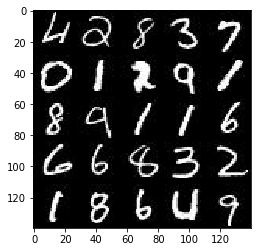

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot
import pickle as pkl

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

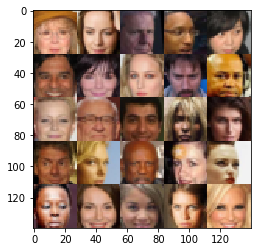

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [3]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.3.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [4]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    real_input = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels))
    z = tf.placeholder(tf.float32, [None, z_dim])
    lr = tf.placeholder(tf.float32, shape=())

    return real_input, z, lr


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [52]:
def discriminator(images, reuse=False, alpha=0.2):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    with tf.variable_scope('discriminator', reuse=reuse):
        x1 = tf.layers.conv2d(images, 64,5, strides=2, padding='same')
        x1 = tf.maximum(alpha * x1, x1)
        #shape=16 * 16 * 64
        x2 = tf.layers.conv2d(x1, 128,5, strides=2, padding='same')
        x2 = tf.layers.batch_normalization(x2, training=True)
        x2 = tf.maximum(alpha * x2, x2)
        #shape=8 * 8 * 128
        x3 = tf.layers.conv2d(x2, 256,5, strides=2, padding='same')
        x3 = tf.layers.batch_normalization(x2, training=True)
        x3 = tf.maximum(alpha * x2, x2)
        #shape=4 * 4 * 256
        last_layer = tf.reshape(x3, (-1, 4 * 4* 256))
        
        logits = tf.layers.dense(last_layer, 1)
        out = tf.sigmoid(logits)

    return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [53]:
def generator(z, out_channel_dim, is_train=True, alpha=0.2):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    reuse = not is_train
    weight_init = tf.random_uniform_initializer
    with tf.variable_scope('generator', reuse=reuse):
        x1 = tf.layers.dense(z, 4 * 4* 512)
        x1 = tf.reshape(x1, (-1, 4,4,512))
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.maximum(alpha * x1, x1)
#         x1 = tf.nn.relu(x1)
        
        x2 = tf.layers.conv2d_transpose(x1, 256, 5, strides=2 , padding='same')
        x2 = tf.layers.batch_normalization(x2, training=is_train )
        x2 = tf.maximum(alpha * x2, x2)
#         x2 = tf.nn.relu(x2)
    
        x3 = tf.layers.conv2d_transpose(x2, 128, 5, strides=2, padding='same')
        x3 = tf.layers.batch_normalization(x3, training=is_train)
        x3 = tf.maximum(alpha * x3, x3)
#         x3 = tf.nn.relu(x3)

        x4 = tf.layers.conv2d_transpose(x3, 64, 5, strides=2, padding='same' )
        x4 = tf.layers.batch_normalization(x4, training=is_train)
        x4 = tf.maximum(alpha * x4, x4)

        
        x4 = tf.layers.conv2d_transpose(x3, out_channel_dim, 5, strides=2, padding='same')
        x4 = tf.image.resize_image_with_crop_or_pad(x4, 28,28)
        out = tf.tanh(x4)
        
    return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [43]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    g_model = generator(input_z, out_channel_dim)
    d_model_real, d_logits_real = discriminator(input_real)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)
    d_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits= d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    d_loss_real = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits= d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss = d_loss_real + d_loss_fake
    g_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits= d_logits_fake, labels=tf.ones_like(d_model_fake)))
    
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [11]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    trainable_vars= tf.trainable_variables()
    g_vars = [x for x in trainable_vars if x.name.startswith('generator')]
    d_vars = [x for x in trainable_vars if x.name.startswith('discriminator')]
    
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate=learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate=learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)
    
    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [12]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [24]:
show_n_images

25

In [42]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    if(data_image_mode == 'RGB'):
        image_channels = 3
    else :
        image_channels = 1
    real_input, z,lr = model_inputs(28,28, image_channels, z_dim)
#     real_input, z,lr = model_inputs(data_shape[0], data_shape[1], data_shape[2], z_dim)
    d_loss, g_loss = model_loss(real_input, z, image_channels)
    d_opt, g_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
    
    samples, losses = [], []
    steps = 0
    saver = tf.train.Saver()
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                steps += 1
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                batch_images = 2 * batch_images
                sess.run(d_opt, feed_dict={real_input:batch_images, z:batch_z})
                sess.run(g_opt, feed_dict={real_input:batch_images, z:batch_z})
                sess.run(g_opt, feed_dict={real_input:batch_images, z:batch_z})
                if (steps %100 == 0):
                    dloss= d_loss.eval({real_input:batch_images, z:batch_z})
                    gloss= g_loss.eval({z:batch_z})
                    print('steps:', steps)
                    print('epoch', epoch_i)
                    print('dloss:', dloss)
                    print('gloss:', gloss)
                    
                    show_generator_output(sess, show_n_images, z, image_channels, data_image_mode)
        
        ckpointName = './checkpoints/generator_faces4' + str(epoch_i + 1) + '.ckpt'
        saver.save(sess,ckpointName)
    
    with open('samples_faces4.pkl', 'wb') as f:
        pkl.dump(samples, f)
    
    return losses, samples
                
                
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

steps: 100
epoch 0
dloss: 2.07364
gloss: 0.263313


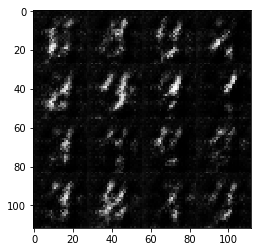

steps: 200
epoch 0
dloss: 1.82047
gloss: 0.368177


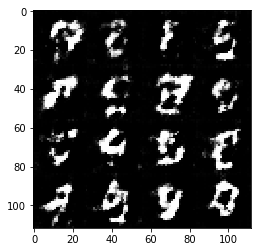

steps: 300
epoch 0
dloss: 1.68013
gloss: 0.425139


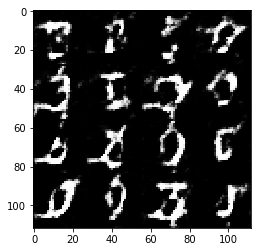

steps: 400
epoch 0
dloss: 1.68455
gloss: 0.440869


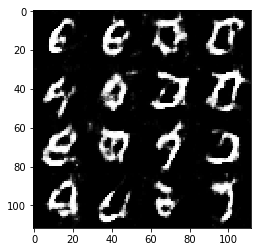

steps: 500
epoch 0
dloss: 1.6208
gloss: 0.47987


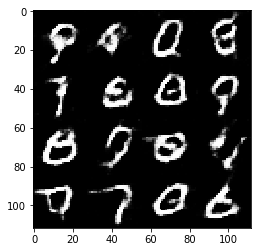

steps: 600
epoch 0
dloss: 1.5886
gloss: 0.484903


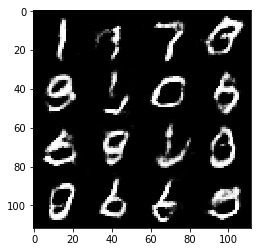

steps: 700
epoch 0
dloss: 1.64881
gloss: 0.471105


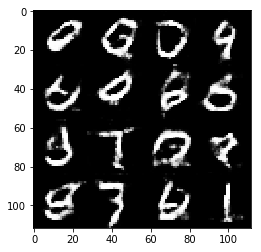

steps: 800
epoch 0
dloss: 1.63286
gloss: 0.468194


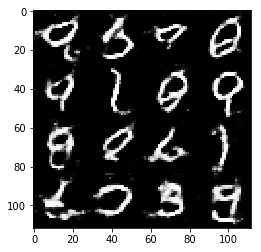

steps: 900
epoch 0
dloss: 1.58729
gloss: 0.485757


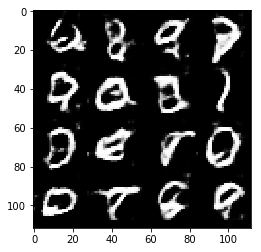

steps: 1000
epoch 1
dloss: 1.56415
gloss: 0.531346


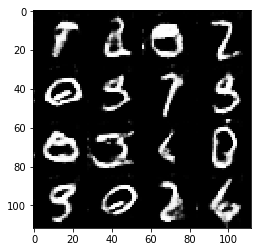

steps: 1100
epoch 1
dloss: 1.58557
gloss: 0.484408


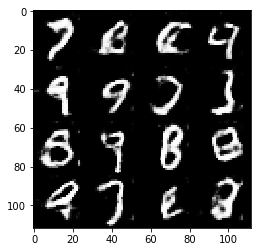

steps: 1200
epoch 1
dloss: 1.57922
gloss: 0.456492


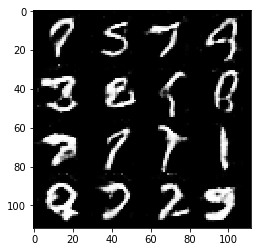

steps: 1300
epoch 1
dloss: 1.55311
gloss: 0.551446


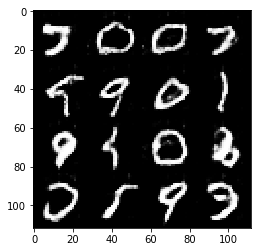

steps: 1400
epoch 1
dloss: 1.53453
gloss: 0.543919


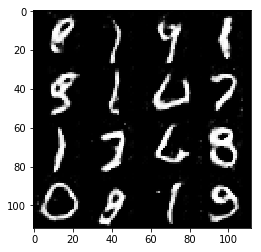

steps: 1500
epoch 1
dloss: 1.55545
gloss: 0.492283


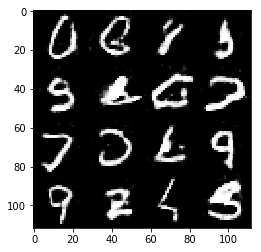

steps: 1600
epoch 1
dloss: 1.53022
gloss: 0.524324


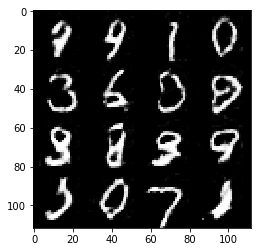

steps: 1700
epoch 1
dloss: 1.49495
gloss: 0.574924


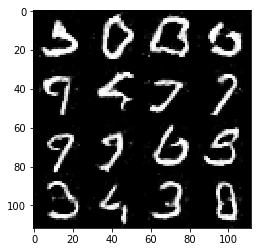

steps: 1800
epoch 1
dloss: 1.59278
gloss: 0.499443


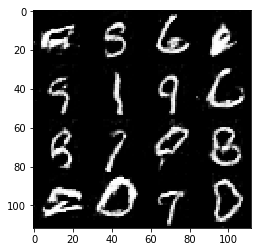

In [18]:
batch_size = 64
z_dim = 100
learning_rate = 0.0002
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

steps: 100
epoch 0
dloss: 1.24437
gloss: 0.625919


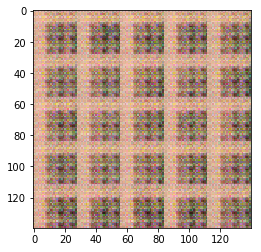

steps: 200
epoch 0
dloss: 1.00536
gloss: 0.822519


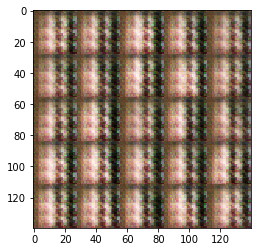

steps: 300
epoch 0
dloss: 1.19108
gloss: 0.597757


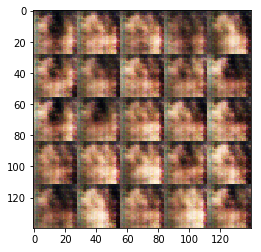

steps: 400
epoch 0
dloss: 1.07824
gloss: 0.841789


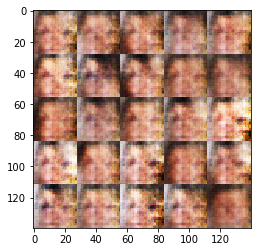

steps: 500
epoch 0
dloss: 1.35175
gloss: 0.661601


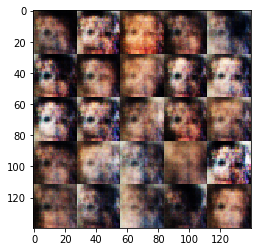

steps: 600
epoch 0
dloss: 1.40178
gloss: 0.562134


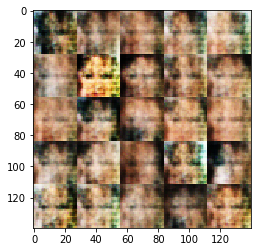

steps: 700
epoch 0
dloss: 1.38931
gloss: 0.586653


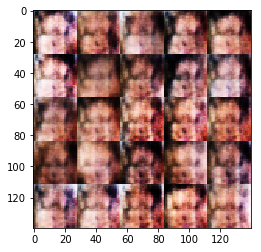

steps: 800
epoch 0
dloss: 1.48014
gloss: 0.520263


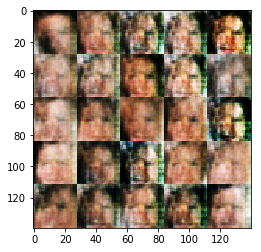

steps: 900
epoch 0
dloss: 1.44556
gloss: 0.580271


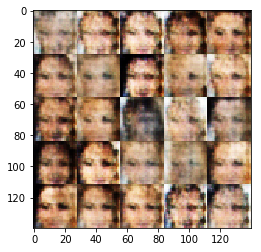

steps: 1000
epoch 0
dloss: 1.3674
gloss: 0.59725


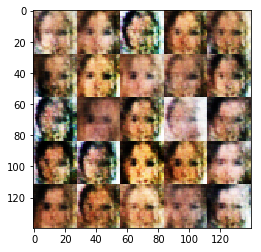

steps: 1100
epoch 0
dloss: 1.51843
gloss: 0.588716


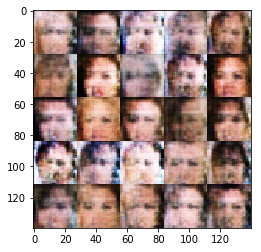

steps: 1200
epoch 0
dloss: 1.51436
gloss: 0.551843


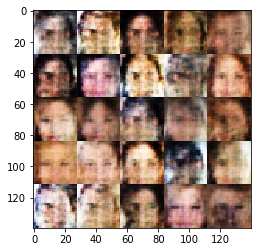

steps: 1300
epoch 0
dloss: 1.48965
gloss: 0.594592


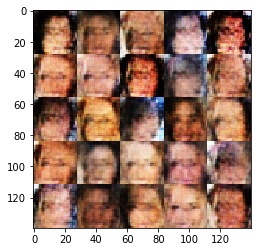

steps: 1400
epoch 0
dloss: 1.5732
gloss: 0.540041


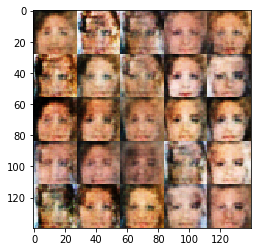

steps: 1500
epoch 0
dloss: 1.57795
gloss: 0.520958


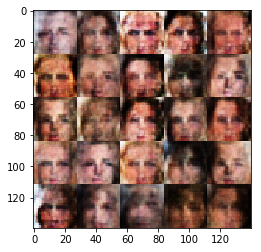

steps: 1600
epoch 0
dloss: 1.50383
gloss: 0.571178


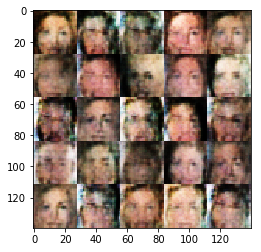

steps: 1700
epoch 0
dloss: 1.43131
gloss: 0.61654


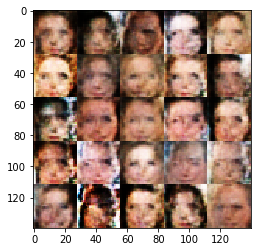

steps: 1800
epoch 0
dloss: 1.5645
gloss: 0.561837


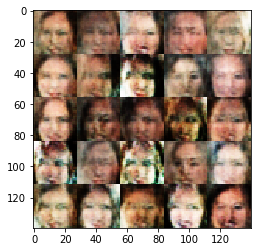

steps: 1900
epoch 0
dloss: 1.51956
gloss: 0.533046


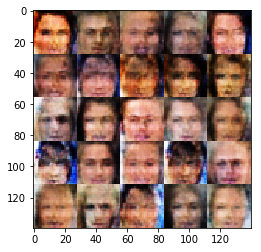

steps: 2000
epoch 0
dloss: 1.44517
gloss: 0.597009


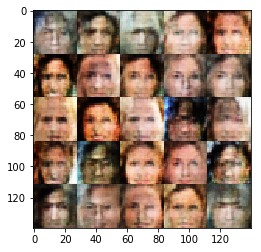

steps: 2100
epoch 0
dloss: 1.48897
gloss: 0.624646


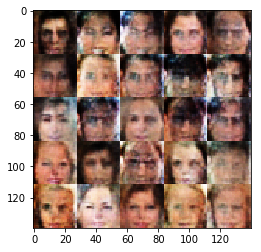

steps: 2200
epoch 0
dloss: 1.52507
gloss: 0.56945


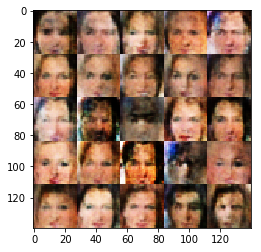

steps: 2300
epoch 0
dloss: 1.52048
gloss: 0.592631


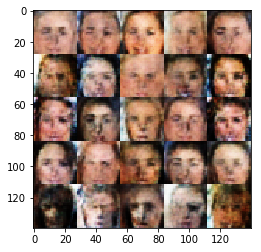

steps: 2400
epoch 0
dloss: 1.4934
gloss: 0.521124


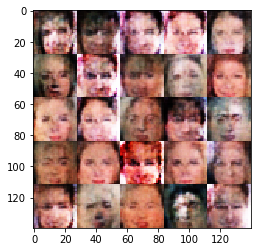

steps: 2500
epoch 0
dloss: 1.49262
gloss: 0.602637


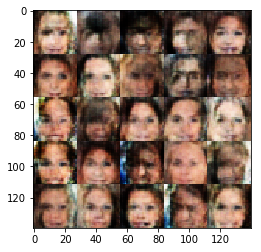

steps: 2600
epoch 0
dloss: 1.52005
gloss: 0.575668


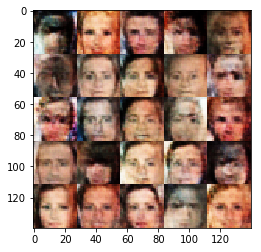

steps: 2700
epoch 0
dloss: 1.47608
gloss: 0.600103


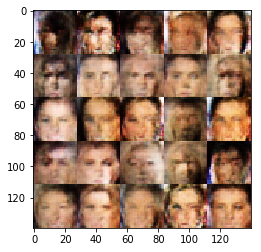

steps: 2800
epoch 0
dloss: 1.42026
gloss: 0.652344


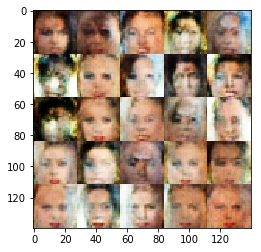

steps: 2900
epoch 0
dloss: 1.46931
gloss: 0.597288


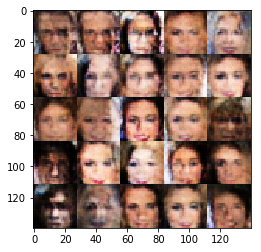

steps: 3000
epoch 0
dloss: 1.55095
gloss: 0.544944


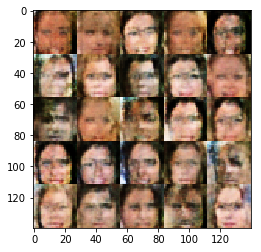

steps: 3100
epoch 0
dloss: 1.44138
gloss: 0.61466


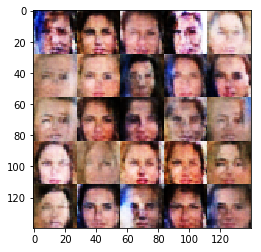

steps: 3200
epoch 0
dloss: 1.53625
gloss: 0.549325


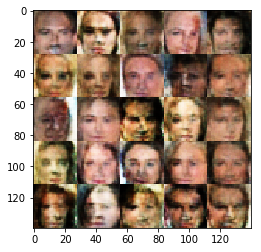

steps: 3300
epoch 0
dloss: 1.50877
gloss: 0.592025


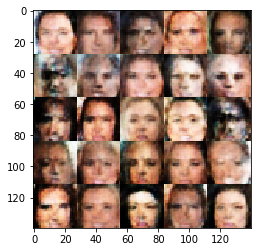

steps: 3400
epoch 0
dloss: 1.51761
gloss: 0.599012


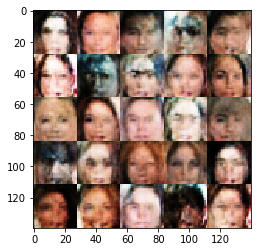

steps: 3500
epoch 0
dloss: 1.51584
gloss: 0.582728


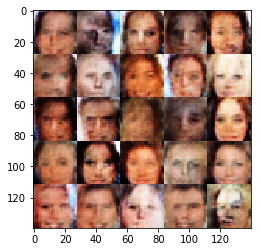

steps: 3600
epoch 0
dloss: 1.47222
gloss: 0.568892


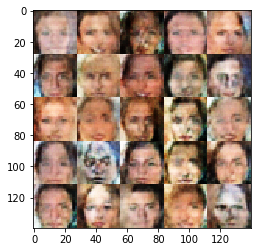

steps: 3700
epoch 0
dloss: 1.47314
gloss: 0.600464


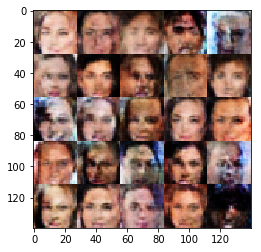

steps: 3800
epoch 0
dloss: 1.45401
gloss: 0.642702


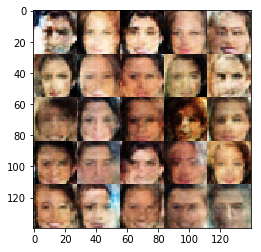

steps: 3900
epoch 0
dloss: 1.50651
gloss: 0.571063


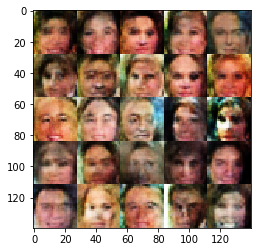

steps: 4000
epoch 0
dloss: 1.48241
gloss: 0.598291


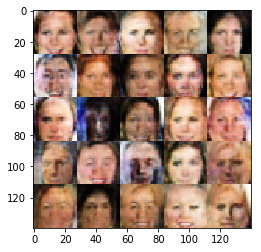

steps: 4100
epoch 0
dloss: 1.47113
gloss: 0.620129


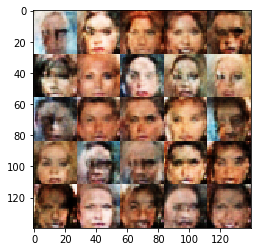

steps: 4200
epoch 0
dloss: 1.43514
gloss: 0.632937


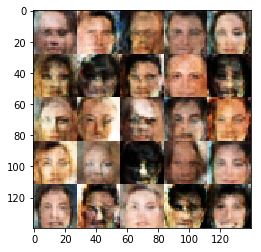

steps: 4300
epoch 0
dloss: 1.47108
gloss: 0.627804


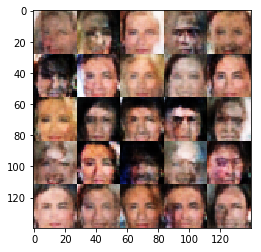

steps: 4400
epoch 0
dloss: 1.46439
gloss: 0.635188


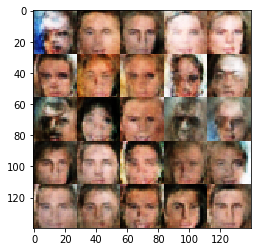

steps: 4500
epoch 0
dloss: 1.51596
gloss: 0.605533


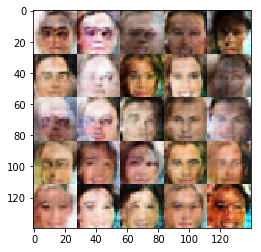

steps: 4600
epoch 0
dloss: 1.41771
gloss: 0.700609


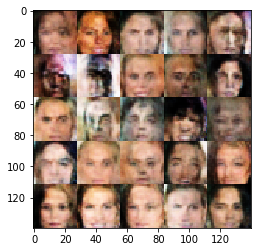

steps: 4700
epoch 0
dloss: 1.48226
gloss: 0.635906


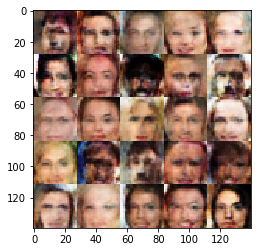

steps: 4800
epoch 0
dloss: 1.43851
gloss: 0.629031


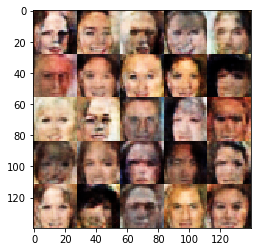

steps: 4900
epoch 0
dloss: 1.50606
gloss: 0.532168


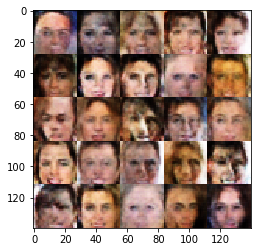

steps: 5000
epoch 0
dloss: 1.45405
gloss: 0.593259


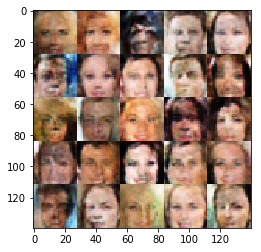

steps: 5100
epoch 0
dloss: 1.44302
gloss: 0.634004


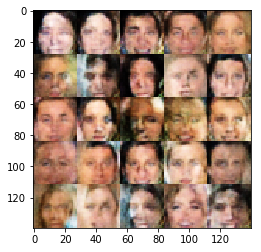

steps: 5200
epoch 0
dloss: 1.5279
gloss: 0.590299


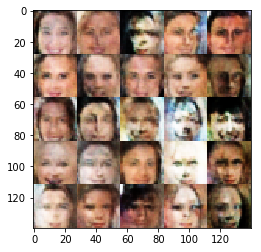

steps: 5300
epoch 0
dloss: 1.52482
gloss: 0.619817


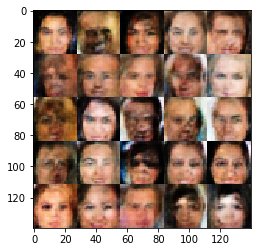

steps: 5400
epoch 0
dloss: 1.49753
gloss: 0.632384


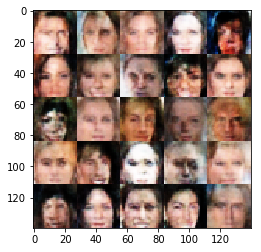

steps: 5500
epoch 0
dloss: 1.40773
gloss: 0.641079


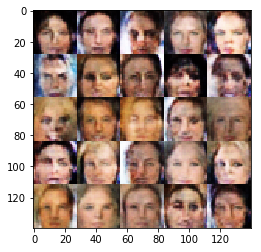

steps: 5600
epoch 0
dloss: 1.41705
gloss: 0.634127


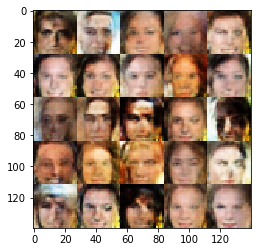

steps: 5700
epoch 0
dloss: 1.46926
gloss: 0.599054


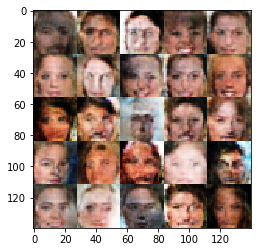

steps: 5800
epoch 0
dloss: 1.45513
gloss: 0.601762


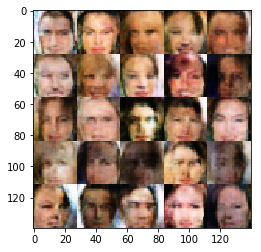

steps: 5900
epoch 0
dloss: 1.49876
gloss: 0.568191


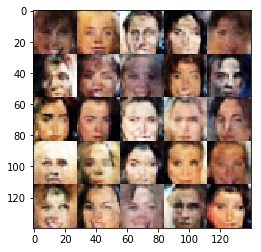

steps: 6000
epoch 0
dloss: 1.46398
gloss: 0.573151


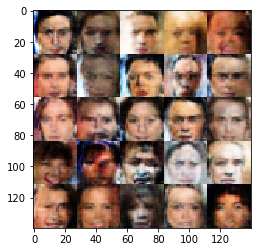

steps: 6100
epoch 0
dloss: 1.45837
gloss: 0.654563


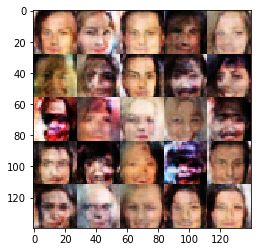

steps: 6200
epoch 0
dloss: 1.40655
gloss: 0.640534


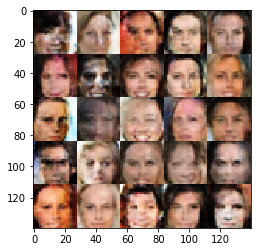

steps: 6300
epoch 0
dloss: 1.46029
gloss: 0.591186


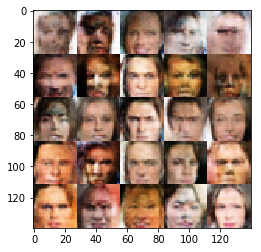

steps: 6400
epoch 1
dloss: 1.445
gloss: 0.627994


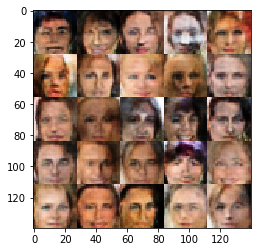

steps: 6500
epoch 1
dloss: 1.46054
gloss: 0.642175


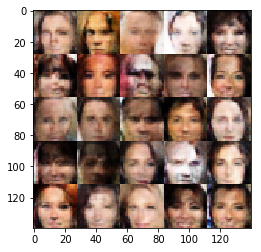

steps: 6600
epoch 1
dloss: 1.43932
gloss: 0.610215


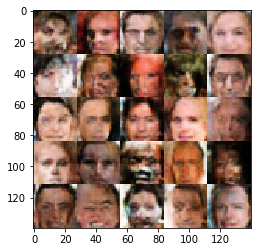

steps: 6700
epoch 1
dloss: 1.44616
gloss: 0.639617


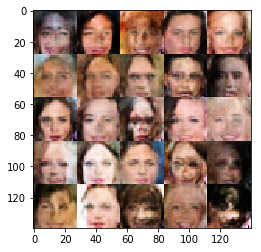

steps: 6800
epoch 1
dloss: 1.48157
gloss: 0.59943


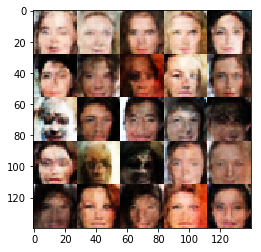

steps: 6900
epoch 1
dloss: 1.45349
gloss: 0.629858


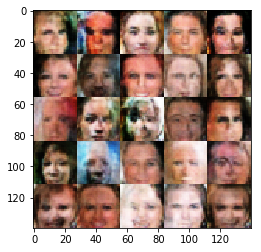

steps: 7000
epoch 1
dloss: 1.43404
gloss: 0.612396


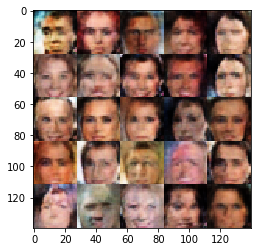

steps: 7100
epoch 1
dloss: 1.42766
gloss: 0.617822


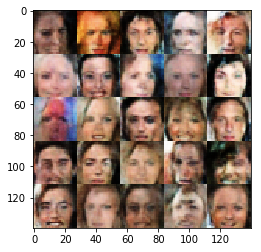

steps: 7200
epoch 1
dloss: 1.45578
gloss: 0.698369


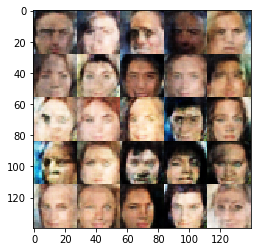

steps: 7300
epoch 1
dloss: 1.41538
gloss: 0.654159


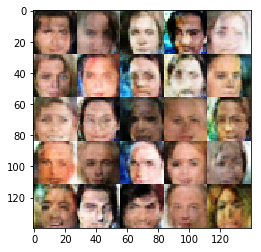

steps: 7400
epoch 1
dloss: 1.48792
gloss: 0.54938


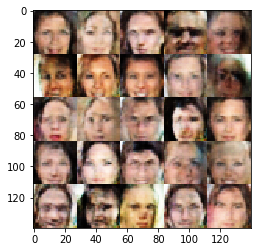

steps: 7500
epoch 1
dloss: 1.41058
gloss: 0.628704


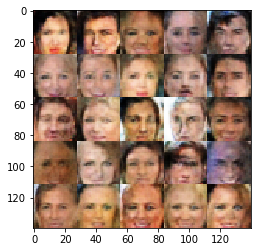

steps: 7600
epoch 1
dloss: 1.49537
gloss: 0.577798


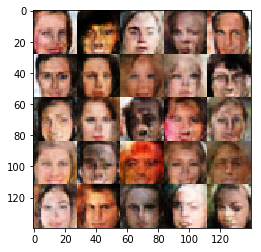

steps: 7700
epoch 1
dloss: 1.42507
gloss: 0.648977


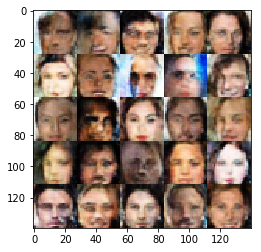

steps: 7800
epoch 1
dloss: 1.40521
gloss: 0.659781


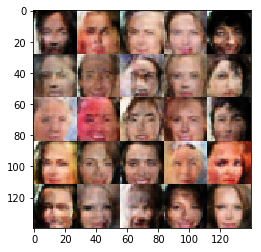

steps: 7900
epoch 1
dloss: 1.42899
gloss: 0.603286


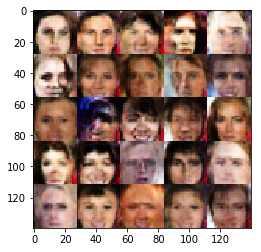

steps: 8000
epoch 1
dloss: 1.44252
gloss: 0.656044


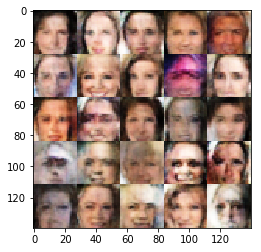

steps: 8100
epoch 1
dloss: 1.49711
gloss: 0.617884


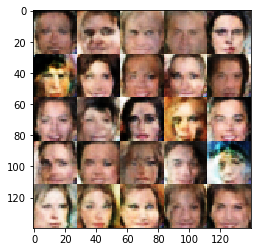

steps: 8200
epoch 1
dloss: 1.49068
gloss: 0.585081


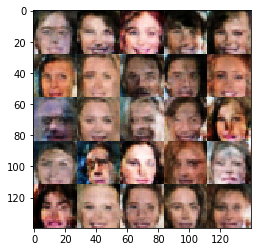

steps: 8300
epoch 1
dloss: 1.41762
gloss: 0.619763


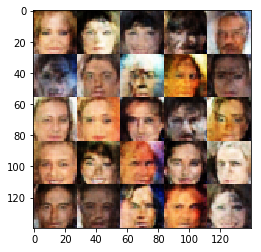

steps: 8400
epoch 1
dloss: 1.43598
gloss: 0.654078


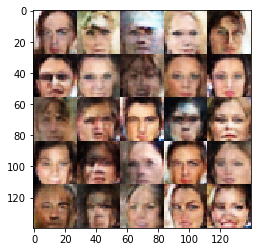

steps: 8500
epoch 1
dloss: 1.48122
gloss: 0.585494


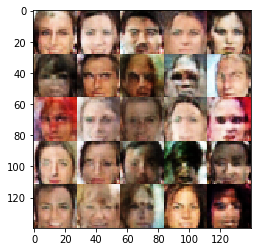

steps: 8600
epoch 1
dloss: 1.4084
gloss: 0.611185


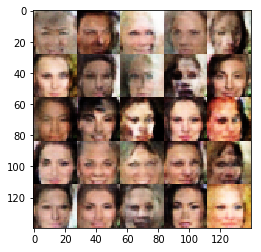

steps: 8700
epoch 1
dloss: 1.44819
gloss: 0.621791


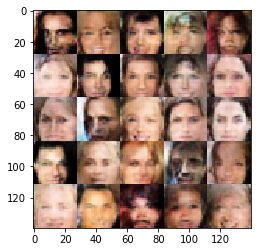

steps: 8800
epoch 1
dloss: 1.43675
gloss: 0.655889


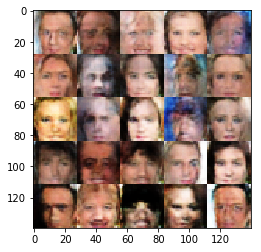

steps: 8900
epoch 1
dloss: 1.39661
gloss: 0.61092


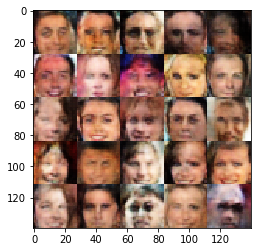

steps: 9000
epoch 1
dloss: 1.46201
gloss: 0.639641


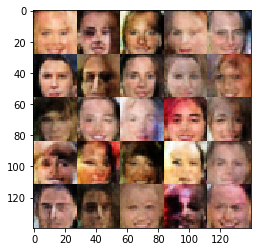

steps: 9100
epoch 1
dloss: 1.42557
gloss: 0.626908


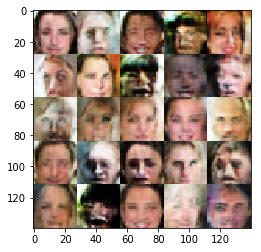

steps: 9200
epoch 1
dloss: 1.46201
gloss: 0.623399


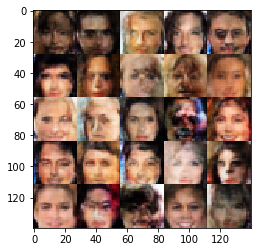

steps: 9300
epoch 1
dloss: 1.42658
gloss: 0.621926


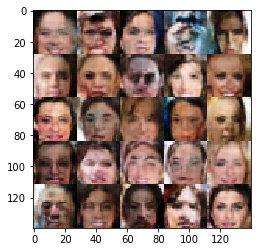

steps: 9400
epoch 1
dloss: 1.41216
gloss: 0.640298


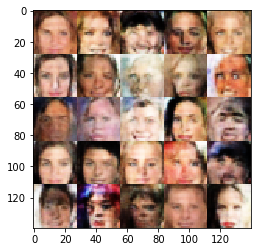

steps: 9500
epoch 1
dloss: 1.38762
gloss: 0.667868


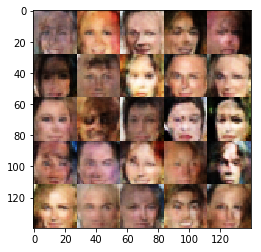

steps: 9600
epoch 1
dloss: 1.44524
gloss: 0.630263


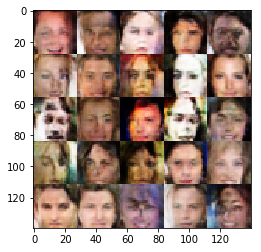

steps: 9700
epoch 1
dloss: 1.40808
gloss: 0.634067


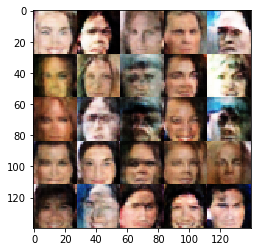

steps: 9800
epoch 1
dloss: 1.43832
gloss: 0.63574


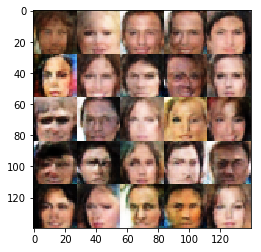

steps: 9900
epoch 1
dloss: 1.42861
gloss: 0.582762


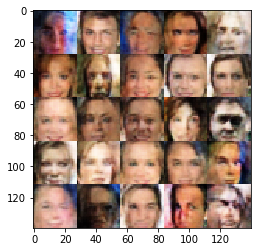

steps: 10000
epoch 1
dloss: 1.43555
gloss: 0.659079


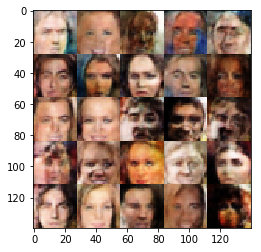

steps: 10100
epoch 1
dloss: 1.47303
gloss: 0.625055


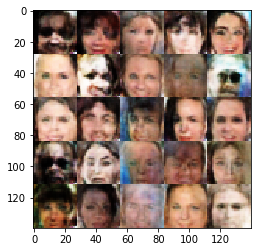

steps: 10200
epoch 1
dloss: 1.43419
gloss: 0.606853


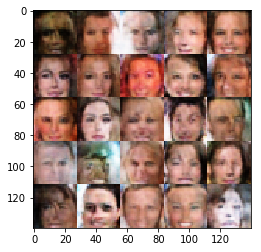

steps: 10300
epoch 1
dloss: 1.45889
gloss: 0.628469


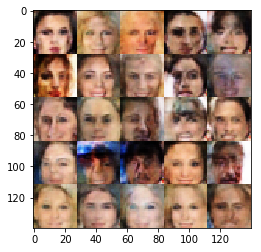

steps: 10400
epoch 1
dloss: 1.43415
gloss: 0.653813


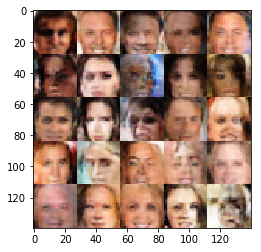

steps: 10500
epoch 1
dloss: 1.44405
gloss: 0.636799


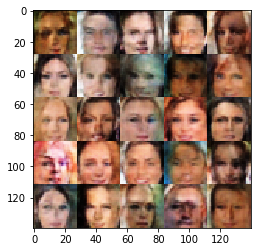

steps: 10600
epoch 1
dloss: 1.44953
gloss: 0.632451


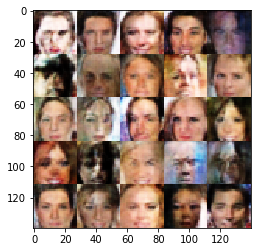

steps: 10700
epoch 1
dloss: 1.42158
gloss: 0.675644


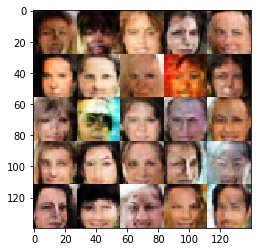

steps: 10800
epoch 1
dloss: 1.45093
gloss: 0.592101


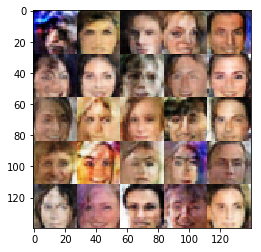

steps: 10900
epoch 1
dloss: 1.45157
gloss: 0.627637


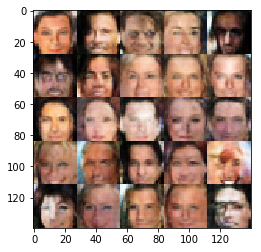

steps: 11000
epoch 1
dloss: 1.43065
gloss: 0.633524


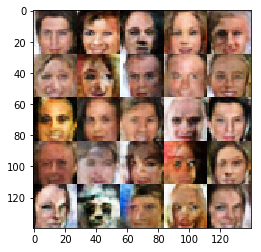

steps: 11100
epoch 1
dloss: 1.42813
gloss: 0.637597


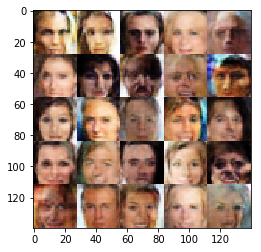

steps: 11200
epoch 1
dloss: 1.41325
gloss: 0.638615


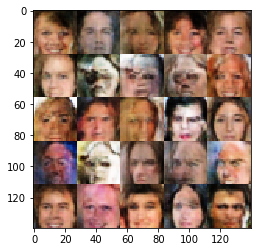

steps: 11300
epoch 1
dloss: 1.44609
gloss: 0.626624


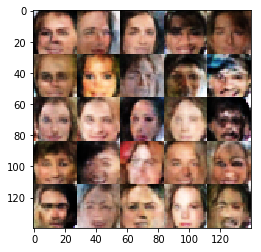

steps: 11400
epoch 1
dloss: 1.4576
gloss: 0.61274


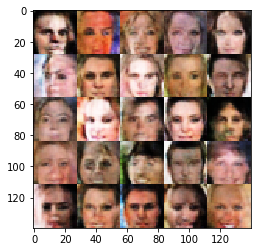

steps: 11500
epoch 1
dloss: 1.45003
gloss: 0.637637


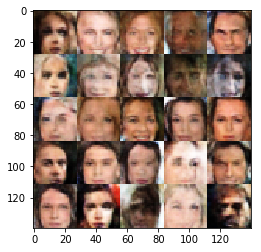

steps: 11600
epoch 1
dloss: 1.40393
gloss: 0.639682


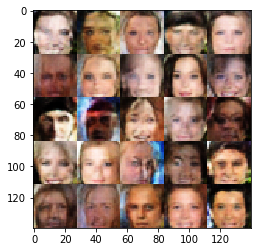

steps: 11700
epoch 1
dloss: 1.40693
gloss: 0.647128


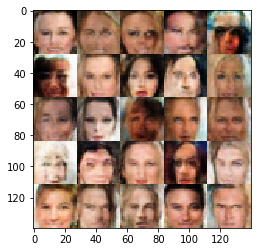

steps: 11800
epoch 1
dloss: 1.43774
gloss: 0.642353


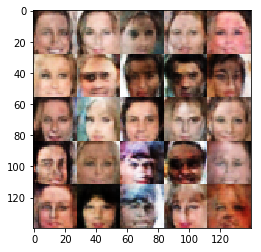

steps: 11900
epoch 1
dloss: 1.46882
gloss: 0.624391


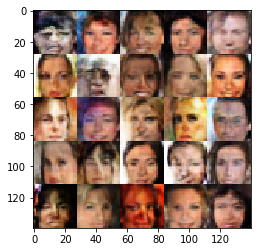

steps: 12000
epoch 1
dloss: 1.40706
gloss: 0.669885


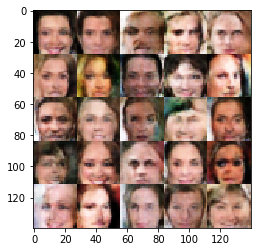

steps: 12100
epoch 1
dloss: 1.41273
gloss: 0.623767


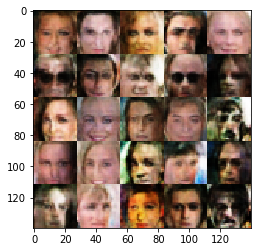

steps: 12200
epoch 1
dloss: 1.3844
gloss: 0.635508


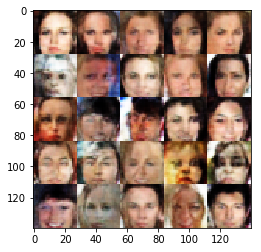

steps: 12300
epoch 1
dloss: 1.4257
gloss: 0.621046


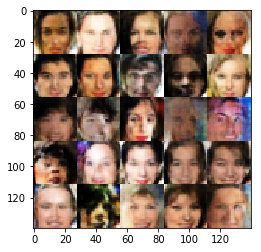

steps: 12400
epoch 1
dloss: 1.43764
gloss: 0.664841


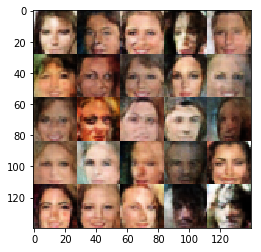

steps: 12500
epoch 1
dloss: 1.42588
gloss: 0.625215


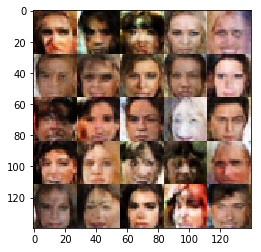

steps: 12600
epoch 1
dloss: 1.41388
gloss: 0.640221


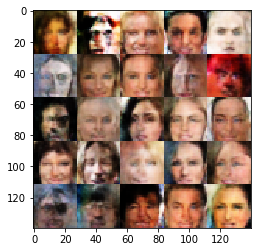

steps: 12700
epoch 2
dloss: 1.41154
gloss: 0.655879


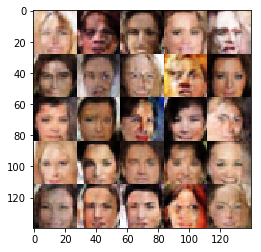

steps: 12800
epoch 2
dloss: 1.44636
gloss: 0.630824


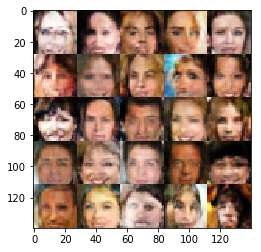

steps: 12900
epoch 2
dloss: 1.40476
gloss: 0.640831


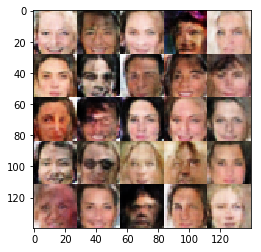

steps: 13000
epoch 2
dloss: 1.4254
gloss: 0.658739


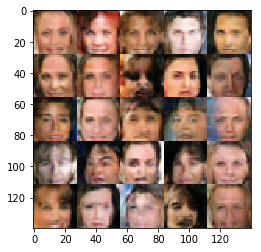

steps: 13100
epoch 2
dloss: 1.40036
gloss: 0.631519


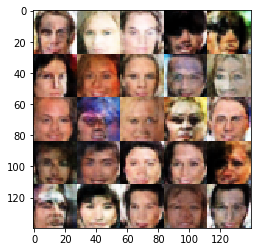

steps: 13200
epoch 2
dloss: 1.46276
gloss: 0.569235


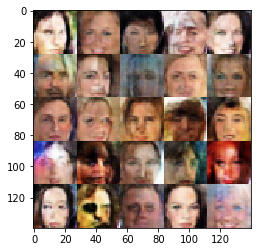

steps: 13300
epoch 2
dloss: 1.4296
gloss: 0.651272


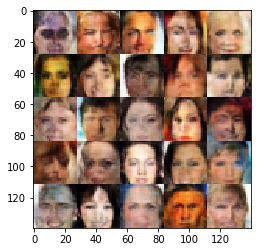

steps: 13400
epoch 2
dloss: 1.41634
gloss: 0.621227


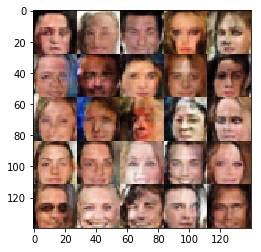

steps: 13500
epoch 2
dloss: 1.42747
gloss: 0.633824


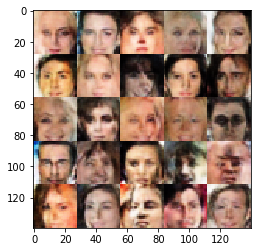

steps: 13600
epoch 2
dloss: 1.40821
gloss: 0.643074


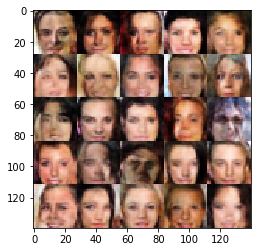

steps: 13700
epoch 2
dloss: 1.42387
gloss: 0.657512


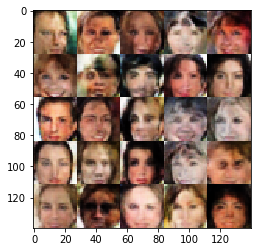

steps: 13800
epoch 2
dloss: 1.4392
gloss: 0.633702


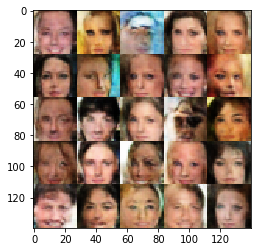

steps: 13900
epoch 2
dloss: 1.38917
gloss: 0.626383


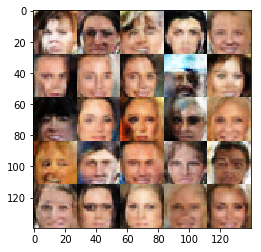

steps: 14000
epoch 2
dloss: 1.42312
gloss: 0.623444


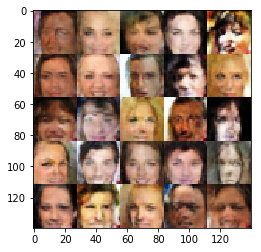

steps: 14100
epoch 2
dloss: 1.43075
gloss: 0.638029


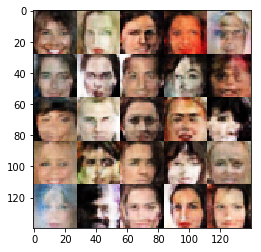

steps: 14200
epoch 2
dloss: 1.41561
gloss: 0.634821


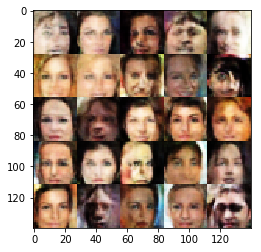

steps: 14300
epoch 2
dloss: 1.46461
gloss: 0.624031


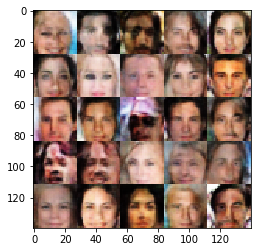

steps: 14400
epoch 2
dloss: 1.40892
gloss: 0.611201


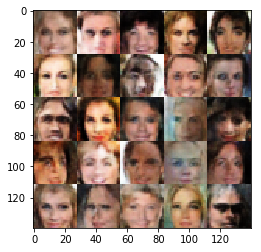

steps: 14500
epoch 2
dloss: 1.47979
gloss: 0.644139


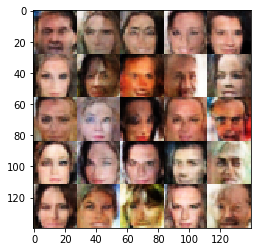

steps: 14600
epoch 2
dloss: 1.43883
gloss: 0.652521


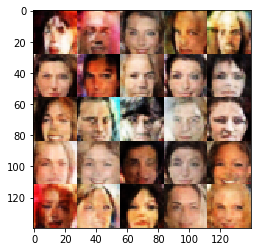

steps: 14700
epoch 2
dloss: 1.41592
gloss: 0.674578


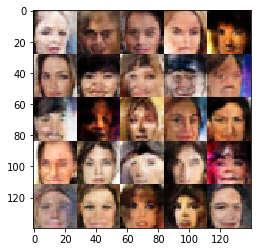

steps: 14800
epoch 2
dloss: 1.43863
gloss: 0.638364


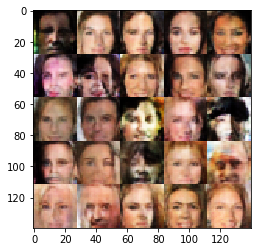

steps: 14900
epoch 2
dloss: 1.38482
gloss: 0.682387


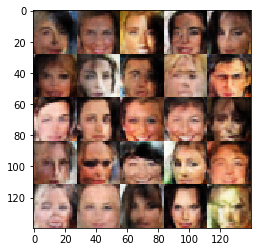

steps: 15000
epoch 2
dloss: 1.44051
gloss: 0.622465


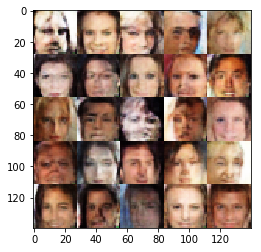

steps: 15100
epoch 2
dloss: 1.40497
gloss: 0.66388


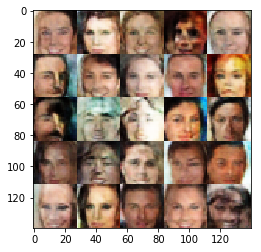

steps: 15200
epoch 2
dloss: 1.42708
gloss: 0.668587


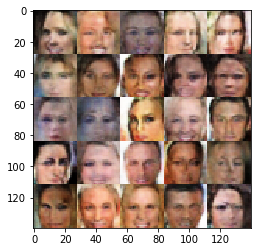

steps: 15300
epoch 2
dloss: 1.45112
gloss: 0.607699


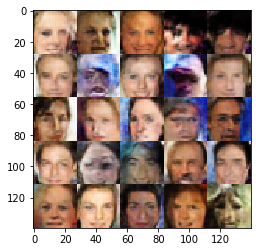

steps: 15400
epoch 2
dloss: 1.39496
gloss: 0.656277


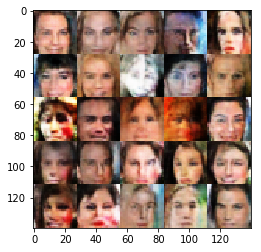

steps: 15500
epoch 2
dloss: 1.42288
gloss: 0.613255


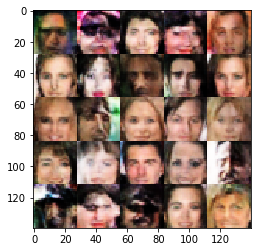

steps: 15600
epoch 2
dloss: 1.42649
gloss: 0.623865


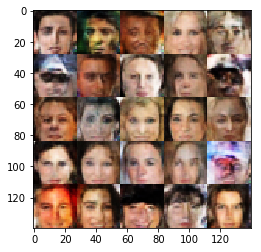

steps: 15700
epoch 2
dloss: 1.41423
gloss: 0.644229


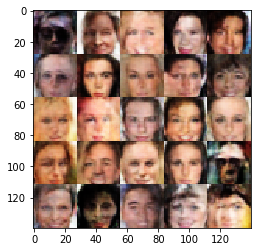

steps: 15800
epoch 2
dloss: 1.44065
gloss: 0.663649


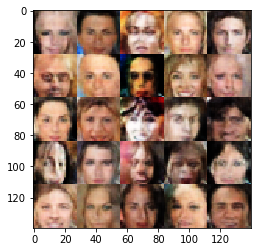

steps: 15900
epoch 2
dloss: 1.41797
gloss: 0.638056


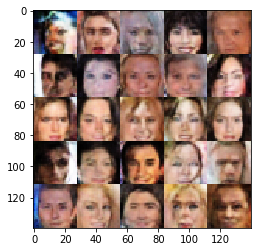

steps: 16000
epoch 2
dloss: 1.41645
gloss: 0.612838


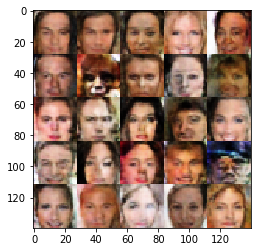

steps: 16100
epoch 2
dloss: 1.4289
gloss: 0.616543


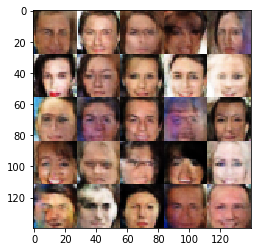

steps: 16200
epoch 2
dloss: 1.41279
gloss: 0.680731


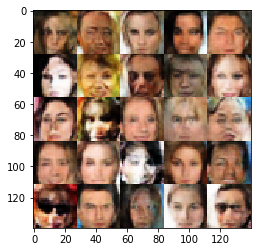

steps: 16300
epoch 2
dloss: 1.43627
gloss: 0.64438


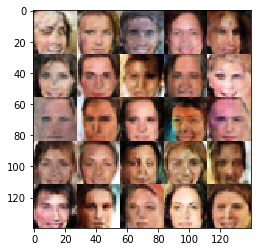

steps: 16400
epoch 2
dloss: 1.42671
gloss: 0.622443


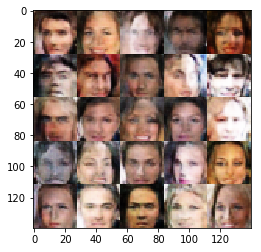

steps: 16500
epoch 2
dloss: 1.44068
gloss: 0.620006


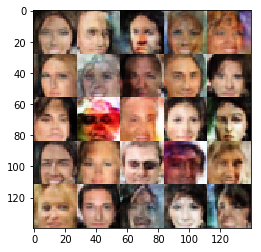

steps: 16600
epoch 2
dloss: 1.40957
gloss: 0.647398


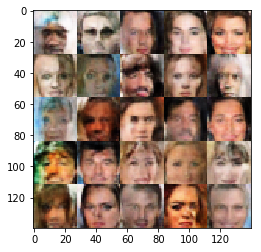

steps: 16700
epoch 2
dloss: 1.43555
gloss: 0.621978


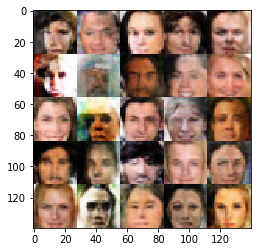

steps: 16800
epoch 2
dloss: 1.4271
gloss: 0.660903


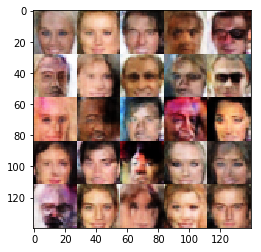

steps: 16900
epoch 2
dloss: 1.41511
gloss: 0.634153


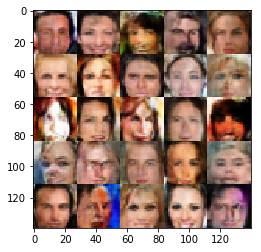

steps: 17000
epoch 2
dloss: 1.44148
gloss: 0.647801


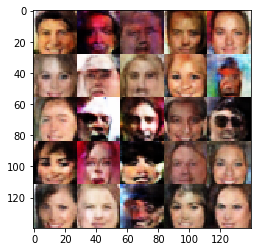

steps: 17100
epoch 2
dloss: 1.43695
gloss: 0.619882


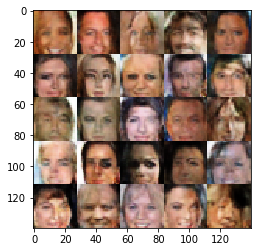

steps: 17200
epoch 2
dloss: 1.43453
gloss: 0.648959


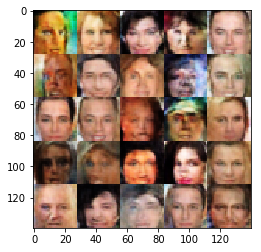

steps: 17300
epoch 2
dloss: 1.41532
gloss: 0.614968


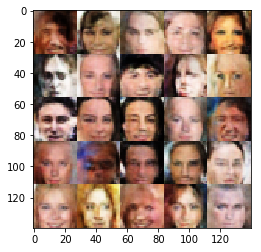

steps: 17400
epoch 2
dloss: 1.3844
gloss: 0.67336


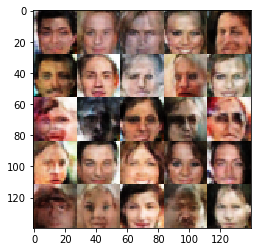

steps: 17500
epoch 2
dloss: 1.45271
gloss: 0.639648


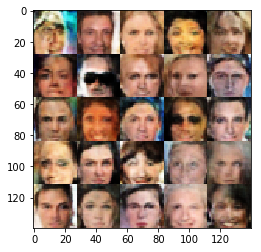

steps: 17600
epoch 2
dloss: 1.42125
gloss: 0.657526


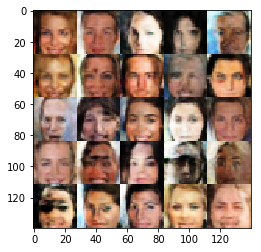

steps: 17700
epoch 2
dloss: 1.43231
gloss: 0.628515


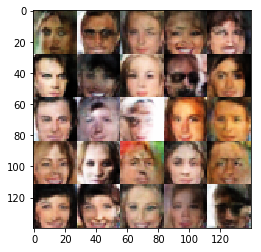

steps: 17800
epoch 2
dloss: 1.43709
gloss: 0.634431


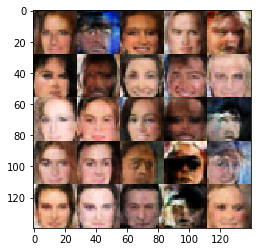

steps: 17900
epoch 2
dloss: 1.41264
gloss: 0.638298


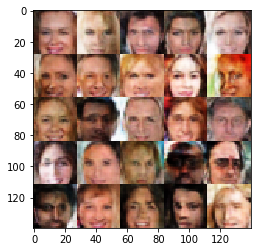

steps: 18000
epoch 2
dloss: 1.42228
gloss: 0.662397


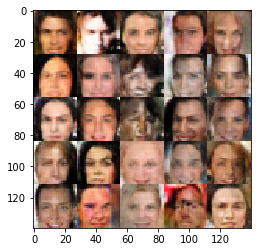

steps: 18100
epoch 2
dloss: 1.43064
gloss: 0.612833


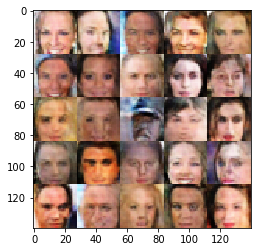

steps: 18200
epoch 2
dloss: 1.4005
gloss: 0.652801


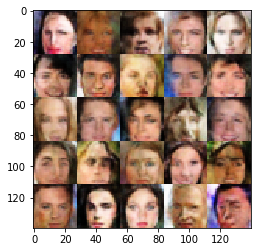

steps: 18300
epoch 2
dloss: 1.44661
gloss: 0.62727


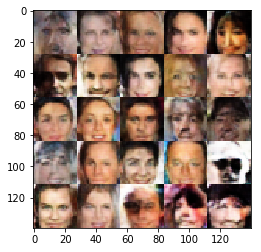

steps: 18400
epoch 2
dloss: 1.43506
gloss: 0.622507


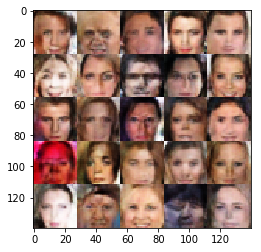

steps: 18500
epoch 2
dloss: 1.4171
gloss: 0.641009


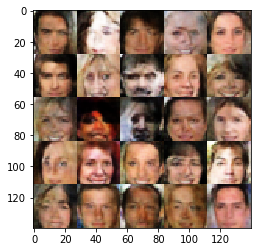

steps: 18600
epoch 2
dloss: 1.41324
gloss: 0.656546


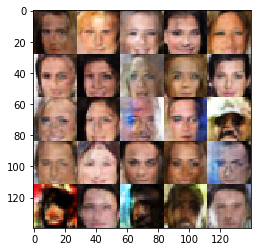

steps: 18700
epoch 2
dloss: 1.37348
gloss: 0.741263


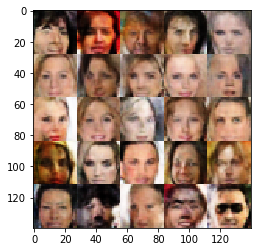

steps: 18800
epoch 2
dloss: 1.43612
gloss: 0.614592


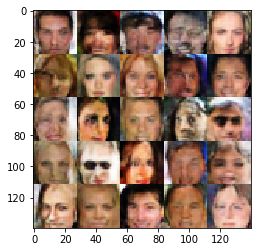

steps: 18900
epoch 2
dloss: 1.41419
gloss: 0.653841


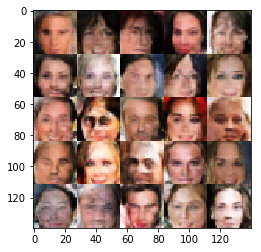

In [56]:
batch_size = 32
z_dim = 100
learning_rate = 0.0002
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 3

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.